##### Steps for reading in dataset (following download), initial QC, dim reduction/clustering and saving out the myeloid cluster for **PMID: 32561858**

This dataset is from the paper Qian, J., Olbrecht, S., Boeckx, B. et al. A pan-cancer blueprint of the heterogeneous tumor microenvironment revealed by single-cell profiling. Cell Res 30, 745–762 (2020). https://doi.org/10.1038/s41422-020-0355-0 

In their data availability statement they say their data is available on this site:  http://blueprint.lambrechtslab.org 

Downlaoded the following files from that site: 
* 8 lung cancer patients
    - 2096-Lungcancer_counts.tar.gz
    - 2097-Lungcancer_metadata.csv.gz
* 7 colorectal cancer patients
    - 2098-Colorectalcancer_counts.tar.gz
    - 2099-Colorectalcancer_metadata.csv.gz
* 5 ovarian cancer patients
    - 2100-Ovariancancer_counts.tar.gz
    - 2101-Ovariancancer_metadata.csv.gz
* 14 breast cancer patients
    - 2102-Breastcancer_counts.tar.gz
    - 2103-Breastcancer_metadata.csv.gz

Downloaded to rdm and then moved to scratch with: 

``` bash
rsync -azvhp /QRISdata/Q5935/nikita/scdata/PMID32561858/ /scratch/user/s4436039/scdata/PMID32561858
```
Then unzipped count files with: 

``` bash
tar -xvf Lungcancer_counts.tar.gz
```
This gave the standard 3 10x files (barcodes, genes, matrix) for each cancer type, had to rezip with gzip and renamed as needed 

Unzipped metadata files with gunzip


In [1]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/PMID32561858')
getwd()

[1] "/scratch/user/s4436039/Nikita-project"

[1] "/scratch/user/s4436039/scdata/PMID32561858"

In [2]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [3]:
#load all datasets
BC.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/PMID32561858/BC_counts") 
CRC.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/PMID32561858/CRC_counts") 
LC.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/PMID32561858/LC_counts") 
OvC.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/PMID32561858/OvC_counts") 

BC.meta <- read.csv("/scratch/user/s4436039/scdata/PMID32561858/2103-Breastcancer_metadata.csv")
CRC.meta <- read.csv("/scratch/user/s4436039/scdata/PMID32561858/2099-Colorectalcancer_metadata.csv")
LC.meta <- read.csv("/scratch/user/s4436039/scdata/PMID32561858/2097-Lungcancer_metadata.csv")
OvC.meta <- read.csv("/scratch/user/s4436039/scdata/PMID32561858/2101-Ovariancancer_metadata.csv")

In [4]:
head(colnames(BC.data))
head(BC.meta)
head(colnames(CRC.data))
head(CRC.meta)
head(colnames(LC.data))
head(LC.meta)
head(colnames(OvC.data))
head(OvC.meta)

[1] "sc5rJUQ024_AAACCTGCAACAACCT" "sc5rJUQ024_AAACCTGCAAGAAGAG"
[3] "sc5rJUQ024_AAACCTGGTCTCCACT" "sc5rJUQ024_AAACCTGTCAACGAAA"
[5] "sc5rJUQ024_AAACGGGAGAGTAAGG" "sc5rJUQ024_AAACGGGCACAGAGGT"

,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
1,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC
2,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell
3,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer
4,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid
5,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast
6,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid


[1] "scrEXT001_AAACCTGGTCGGCTCA" "scrEXT001_AAACCTGGTCTTTCAT"
[3] "scrEXT001_AAACCTGTCACCACCT" "scrEXT001_AAACCTGTCGTCCAGG"
[5] "scrEXT001_AAACCTGTCTGGGCCA" "scrEXT001_AAACGGGAGTGAAGTT"

,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
1,scrEXT001_AAACCTGGTCGGCTCA,345,633,TRUE,31,CRC,C,Cancer
2,scrEXT001_AAACCTGGTCTTTCAT,2640,8119,TRUE,31,CRC,C,Cancer
3,scrEXT001_AAACCTGTCACCACCT,2129,6999,TRUE,31,CRC,C,Myeloid
4,scrEXT001_AAACCTGTCGTCCAGG,1297,3351,TRUE,31,CRC,C,T_cell
5,scrEXT001_AAACCTGTCTGGGCCA,4912,23972,TRUE,31,CRC,C,Fibroblast
6,scrEXT001_AAACGGGAGTGAAGTT,3037,11716,TRUE,31,CRC,C,Fibroblast


[1] "BT1238_AAATCAACTGCCTC" "BT1238_AACATTGACCTAAG" "BT1238_AACCAGTGCTTAGG"
[4] "BT1238_AACCTACTCGCTAA" "BT1238_AACTCTTGCTGTAG" "BT1238_AACTTGCTACTCTT"

,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
1,BT1238_AAATCAACTGCCTC,897,3227,TRUE,1,Lung,I,Cancer
2,BT1238_AACATTGACCTAAG,509,731,TRUE,1,Lung,I,Cancer
3,BT1238_AACCAGTGCTTAGG,642,2958,TRUE,1,Lung,I,Myeloid
4,BT1238_AACCTACTCGCTAA,925,2781,TRUE,1,Lung,I,T_cell
5,BT1238_AACTCTTGCTGTAG,713,3000,TRUE,1,Lung,I,T_cell
6,BT1238_AACTTGCTACTCTT,2351,11433,TRUE,1,Lung,I,Cancer


[1] "BT1303_AAACCTGAGAGCCCAA" "BT1303_AAACCTGAGGCATGGT"
[3] "BT1303_AAACCTGAGTATTGGA" "BT1303_AAACCTGAGTGCAAGC"
[5] "BT1303_AAACCTGAGTGGTAAT" "BT1303_AAACCTGAGTGGTAGC"

,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
1,BT1303_AAACCTGAGAGCCCAA,208,951,1,11,Ovarian,Omentum,Cancer
2,BT1303_AAACCTGAGGCATGGT,249,421,1,11,Ovarian,Omentum,T_cell
3,BT1303_AAACCTGAGTATTGGA,226,407,1,11,Ovarian,Omentum,Cancer
4,BT1303_AAACCTGAGTGCAAGC,1433,2992,1,11,Ovarian,Omentum,Fibroblast
5,BT1303_AAACCTGAGTGGTAAT,259,409,1,11,Ovarian,Omentum,Cancer
6,BT1303_AAACCTGAGTGGTAGC,1063,2531,1,11,Ovarian,Omentum,Fibroblast


In [5]:
#create seurat object for each cancer type
BC <- CreateSeuratObject(counts = BC.data, project = "PMID32561858", min.features = 200, meta.data = BC.meta)
CRC <- CreateSeuratObject(counts = CRC.data, project = "PMID32561858", min.features = 200, meta.data = CRC.meta)
LC <- CreateSeuratObject(counts = LC.data, project = "PMID32561858", min.features = 200, meta.data = LC.meta)
OvC <- CreateSeuratObject(counts = OvC.data, project = "PMID32561858", min.features = 200, meta.data = OvC.meta)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [6]:
head(BC@meta.data)
head(CRC@meta.data)
head(LC@meta.data)
head(OvC@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
sc5rJUQ024_AAACCTGCAACAACCT,sc5rJUQ024,1624,894,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC
sc5rJUQ024_AAACCTGCAAGAAGAG,sc5rJUQ024,2983,1401,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell
sc5rJUQ024_AAACCTGGTCTCCACT,sc5rJUQ024,1141,585,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer
sc5rJUQ024_AAACCTGTCAACGAAA,sc5rJUQ024,18953,4233,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid
sc5rJUQ024_AAACGGGAGAGTAAGG,sc5rJUQ024,3794,1669,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast
sc5rJUQ024_AAACGGGCACAGAGGT,sc5rJUQ024,4891,1818,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
scrEXT001_AAACCTGGTCGGCTCA,scrEXT001,633,345,scrEXT001_AAACCTGGTCGGCTCA,345,633,TRUE,31,CRC,C,Cancer
scrEXT001_AAACCTGGTCTTTCAT,scrEXT001,8119,2640,scrEXT001_AAACCTGGTCTTTCAT,2640,8119,TRUE,31,CRC,C,Cancer
scrEXT001_AAACCTGTCACCACCT,scrEXT001,6999,2129,scrEXT001_AAACCTGTCACCACCT,2129,6999,TRUE,31,CRC,C,Myeloid
scrEXT001_AAACCTGTCGTCCAGG,scrEXT001,3351,1297,scrEXT001_AAACCTGTCGTCCAGG,1297,3351,TRUE,31,CRC,C,T_cell
scrEXT001_AAACCTGTCTGGGCCA,scrEXT001,23972,4912,scrEXT001_AAACCTGTCTGGGCCA,4912,23972,TRUE,31,CRC,C,Fibroblast
scrEXT001_AAACGGGAGTGAAGTT,scrEXT001,11716,3037,scrEXT001_AAACGGGAGTGAAGTT,3037,11716,TRUE,31,CRC,C,Fibroblast


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
BT1238_AAATCAACTGCCTC,BT1238,3227,897,BT1238_AAATCAACTGCCTC,897,3227,TRUE,1,Lung,I,Cancer
BT1238_AACATTGACCTAAG,BT1238,731,509,BT1238_AACATTGACCTAAG,509,731,TRUE,1,Lung,I,Cancer
BT1238_AACCAGTGCTTAGG,BT1238,2958,642,BT1238_AACCAGTGCTTAGG,642,2958,TRUE,1,Lung,I,Myeloid
BT1238_AACCTACTCGCTAA,BT1238,2781,925,BT1238_AACCTACTCGCTAA,925,2781,TRUE,1,Lung,I,T_cell
BT1238_AACTCTTGCTGTAG,BT1238,3000,713,BT1238_AACTCTTGCTGTAG,713,3000,TRUE,1,Lung,I,T_cell
BT1238_AACTTGCTACTCTT,BT1238,11433,2351,BT1238_AACTTGCTACTCTT,2351,11433,TRUE,1,Lung,I,Cancer


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
BT1303_AAACCTGAGAGCCCAA,BT1303,951,208,BT1303_AAACCTGAGAGCCCAA,208,951,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGGCATGGT,BT1303,421,249,BT1303_AAACCTGAGGCATGGT,249,421,1,11,Ovarian,Omentum,T_cell
BT1303_AAACCTGAGTATTGGA,BT1303,407,226,BT1303_AAACCTGAGTATTGGA,226,407,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGTGCAAGC,BT1303,2992,1433,BT1303_AAACCTGAGTGCAAGC,1433,2992,1,11,Ovarian,Omentum,Fibroblast
BT1303_AAACCTGAGTGGTAAT,BT1303,409,259,BT1303_AAACCTGAGTGGTAAT,259,409,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGTGGTAGC,BT1303,2531,1063,BT1303_AAACCTGAGTGGTAGC,1063,2531,1,11,Ovarian,Omentum,Fibroblast


In [7]:
table(BC$orig.ident)
table(BC$CellFromTumor)
table(BC$PatientNumber)
table(BC$TumorType)
table(BC$TumorSite)

table(CRC$orig.ident)
table(CRC$CellFromTumor)
table(CRC$PatientNumber)
table(CRC$TumorType)
table(CRC$TumorSite)

table(LC$orig.ident)
table(LC$CellFromTumor)
table(LC$PatientNumber)
table(LC$TumorType)
table(LC$TumorSite)

table(OvC$orig.ident)
table(OvC$CellFromTumor)
table(OvC$PatientNumber)
table(OvC$TumorType)
table(OvC$TumorSite)


sc5rJUQ024 sc5rJUQ026 sc5rJUQ033 sc5rJUQ039 sc5rJUQ042 sc5rJUQ043 sc5rJUQ045 
      3921       4876       4251       3558       4472        201       1719 
sc5rJUQ046 sc5rJUQ050 sc5rJUQ051 sc5rJUQ053 sc5rJUQ058 sc5rJUQ060 sc5rJUQ064 
      2427       4616        902       4862        362       3641       4216 


 TRUE 
44024 


  41   42   43   44   45   46   47   48   49   50   51   52   53   54 
3921 4876 4251 3558 4472  201 1719 2427 4616  902 4862  362 3641 4216 


   BC 
44024 


Biopsy 
 44024 


scrEXT001 scrEXT002 scrEXT003 scrEXT009 scrEXT010 scrEXT011 scrEXT012 scrEXT013 
     2712      2901      2666      4936      4461      2478      2871      2323 
scrEXT014 scrEXT018 scrEXT019 scrEXT020 scrEXT021 scrEXT022 scrEXT023 scrEXT024 
     1904      3770      2271      1997       709       621      1261       530 
scrEXT025 scrEXT026 scrEXT027 scrEXT028 scrEXT029 
      720      1119       747      1054      2633 


FALSE  TRUE 
14058 30626 


   31    32    33    35    36    37    38 
 8279 11875  7098  8038  2591  2369  4434 


  CRC 
44684 


    B     C     N 
14351 16275 14058 


   BT1238    BT1239    BT1240    BT1241    BT1242    BT1243    BT1244    BT1245 
      175       251        98       302       294       353       630        31 
   BT1246    BT1247    BT1248    BT1249    BT1290    BT1291    BT1292    BT1293 
      122       356      1541       119      4123      4379      3517      4772 
   BT1294    BT1295    BT1296    BT1297    BT1298    BT1299    BT1300    BT1301 
     3333      3282      5164      5493      3628      5012      6124      6403 
   BT1375    BT1376    BT1377    BT1378 scrBT1425 scrBT1426 scrBT1427 scrBT1428 
     1735      1429       814      2971      2902      3708      3495      6254 
scrBT1429 scrBT1430 scrBT1431 scrBT1432 
     3177      2455      3509      1624 


FALSE  TRUE 
27266 66309 


    1     2     3     4     5     6     7     8 
 1473  2799 16791 17272 21167  6949 16359 10765 


 Lung 
93575 


    I     M     N     O     U 
14807 20237 27266 17182 14083 


   BT1303    BT1304    BT1305    BT1306    BT1307 scrSOL001 scrSOL003 scrSOL004 
     8623      4348      1432      1501      6351      5151      5450      6257 
scrSOL006 scrSOL007 
     1136      4865 


    0     1 
10645 34469 


   11    12    13    14    15 
22255  5151  5450  6257  6001 


Ovarian 
  45114 


   Omentum    Ovarium Peritoneum 
     12971      12352      19791 

Doing each tumour type one at a time, breast cancer:

In [8]:
head(BC@meta.data)
table(BC$orig.ident)
table(BC$CellFromTumor)
table(BC$PatientNumber)
table(BC$TumorType)
table(BC$TumorSite)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
sc5rJUQ024_AAACCTGCAACAACCT,sc5rJUQ024,1624,894,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC
sc5rJUQ024_AAACCTGCAAGAAGAG,sc5rJUQ024,2983,1401,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell
sc5rJUQ024_AAACCTGGTCTCCACT,sc5rJUQ024,1141,585,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer
sc5rJUQ024_AAACCTGTCAACGAAA,sc5rJUQ024,18953,4233,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid
sc5rJUQ024_AAACGGGAGAGTAAGG,sc5rJUQ024,3794,1669,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast
sc5rJUQ024_AAACGGGCACAGAGGT,sc5rJUQ024,4891,1818,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid



sc5rJUQ024 sc5rJUQ026 sc5rJUQ033 sc5rJUQ039 sc5rJUQ042 sc5rJUQ043 sc5rJUQ045 
      3921       4876       4251       3558       4472        201       1719 
sc5rJUQ046 sc5rJUQ050 sc5rJUQ051 sc5rJUQ053 sc5rJUQ058 sc5rJUQ060 sc5rJUQ064 
      2427       4616        902       4862        362       3641       4216 


 TRUE 
44024 


  41   42   43   44   45   46   47   48   49   50   51   52   53   54 
3921 4876 4251 3558 4472  201 1719 2427 4616  902 4862  362 3641 4216 


   BC 
44024 


Biopsy 
 44024 

In [9]:
BC_41 <- subset(BC, subset = PatientNumber %in% c("41"))
BC_42 <- subset(BC, subset = PatientNumber %in% c("42"))
BC_43 <- subset(BC, subset = PatientNumber %in% c("43"))
BC_44 <- subset(BC, subset = PatientNumber %in% c("44"))
BC_45 <- subset(BC, subset = PatientNumber %in% c("45"))
BC_46 <- subset(BC, subset = PatientNumber %in% c("46"))
BC_47 <- subset(BC, subset = PatientNumber %in% c("47"))
BC_48 <- subset(BC, subset = PatientNumber %in% c("48"))
BC_49 <- subset(BC, subset = PatientNumber %in% c("49"))
BC_50 <- subset(BC, subset = PatientNumber %in% c("50"))
BC_51 <- subset(BC, subset = PatientNumber %in% c("51"))
BC_52 <- subset(BC, subset = PatientNumber %in% c("52"))
BC_53 <- subset(BC, subset = PatientNumber %in% c("53"))
BC_54 <- subset(BC, subset = PatientNumber %in% c("54"))

In [10]:
#Add dataset info to colnames
colnames(BC_41) <- paste0("PMID32561858_BC_Pt41_", colnames(BC_41))
colnames(BC_42) <- paste0("PMID32561858_BC_Pt42_", colnames(BC_42))
colnames(BC_43) <- paste0("PMID32561858_BC_Pt43_", colnames(BC_43))
colnames(BC_44) <- paste0("PMID32561858_BC_Pt44_", colnames(BC_44))
colnames(BC_45) <- paste0("PMID32561858_BC_Pt45_", colnames(BC_45))
colnames(BC_46) <- paste0("PMID32561858_BC_Pt46_", colnames(BC_46))
colnames(BC_47) <- paste0("PMID32561858_BC_Pt47_", colnames(BC_47))
colnames(BC_48) <- paste0("PMID32561858_BC_Pt48_", colnames(BC_48))
colnames(BC_49) <- paste0("PMID32561858_BC_Pt49_", colnames(BC_49))
colnames(BC_50) <- paste0("PMID32561858_BC_Pt50_", colnames(BC_50))
colnames(BC_51) <- paste0("PMID32561858_BC_Pt51_", colnames(BC_51))
colnames(BC_52) <- paste0("PMID32561858_BC_Pt52_", colnames(BC_52))
colnames(BC_53) <- paste0("PMID32561858_BC_Pt53_", colnames(BC_53))
colnames(BC_54) <- paste0("PMID32561858_BC_Pt54_", colnames(BC_54))

In [11]:
head(colnames(BC_41))
head(colnames(BC_54))

[1] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAACAACCT"
[2] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAAGAAGAG"
[3] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGGTCTCCACT"
[4] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGTCAACGAAA"
[5] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGAGAGTAAGG"
[6] "PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGCACAGAGGT"

[1] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGAGACCTAGG"
[2] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGAGAGGTAGA"
[3] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGAGATATACG"
[4] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGAGCTCTCGG"
[5] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGAGTCGTTTG"
[6] "PMID32561858_BC_Pt54_sc5rJUQ064_AAACCTGGTACCGTAT"

In [12]:
#add metadata to sample
BC_41@meta.data$sample_type <- "tumour"
BC_41@meta.data$cancer_type <- "breast cancer"
BC_41@meta.data$patient_id <- "BC_41"
BC_41@meta.data$sample_id <- "PMID32561858_breast_41"

BC_42@meta.data$sample_type <- "tumour"
BC_42@meta.data$cancer_type <- "breast cancer"
BC_42@meta.data$patient_id <- "BC_42"
BC_42@meta.data$sample_id <- "PMID32561858_breast_42"

BC_43@meta.data$sample_type <- "tumour"
BC_43@meta.data$cancer_type <- "breast cancer"
BC_43@meta.data$patient_id <- "BC_43"
BC_43@meta.data$sample_id <- "PMID32561858_breast_43"

BC_44@meta.data$sample_type <- "tumour"
BC_44@meta.data$cancer_type <- "breast cancer"
BC_44@meta.data$patient_id <- "BC_44"
BC_44@meta.data$sample_id <- "PMID32561858_breast_44"

BC_45@meta.data$sample_type <- "tumour"
BC_45@meta.data$cancer_type <- "breast cancer"
BC_45@meta.data$patient_id <- "BC_45"
BC_45@meta.data$sample_id <- "PMID32561858_breast_45"

BC_46@meta.data$sample_type <- "tumour"
BC_46@meta.data$cancer_type <- "breast cancer"
BC_46@meta.data$patient_id <- "BC_46"
BC_46@meta.data$sample_id <- "PMID32561858_breast_46"

BC_47@meta.data$sample_type <- "tumour"
BC_47@meta.data$cancer_type <- "breast cancer"
BC_47@meta.data$patient_id <- "BC_47"
BC_47@meta.data$sample_id <- "PMID32561858_breast_47"

BC_48@meta.data$sample_type <- "tumour"
BC_48@meta.data$cancer_type <- "breast cancer"
BC_48@meta.data$patient_id <- "BC_48"
BC_48@meta.data$sample_id <- "PMID32561858_breast_48"

BC_49@meta.data$sample_type <- "tumour"
BC_49@meta.data$cancer_type <- "breast cancer"
BC_49@meta.data$patient_id <- "BC_49"
BC_49@meta.data$sample_id <- "PMID32561858_breast_49"

BC_50@meta.data$sample_type <- "tumour"
BC_50@meta.data$cancer_type <- "breast cancer"
BC_50@meta.data$patient_id <- "BC_50"
BC_50@meta.data$sample_id <- "PMID32561858_breast_50"

BC_51@meta.data$sample_type <- "tumour"
BC_51@meta.data$cancer_type <- "breast cancer"
BC_51@meta.data$patient_id <- "BC_51"
BC_51@meta.data$sample_id <- "PMID32561858_breast_51"

BC_52@meta.data$sample_type <- "tumour"
BC_52@meta.data$cancer_type <- "breast cancer"
BC_52@meta.data$patient_id <- "BC_52"
BC_52@meta.data$sample_id <- "PMID32561858_breast_52"

BC_53@meta.data$sample_type <- "tumour"
BC_53@meta.data$cancer_type <- "breast cancer"
BC_53@meta.data$patient_id <- "BC_53"
BC_53@meta.data$sample_id <- "PMID32561858_breast_53"

BC_54@meta.data$sample_type <- "tumour"
BC_54@meta.data$cancer_type <- "breast cancer"
BC_54@meta.data$patient_id <- "BC_54"
BC_54@meta.data$sample_id <- "PMID32561858_breast_54"

In [13]:
head(BC_41@meta.data) 
head(BC_53@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAACAACCT,sc5rJUQ024,1624,894,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAAGAAGAG,sc5rJUQ024,2983,1401,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGGTCTCCACT,sc5rJUQ024,1141,585,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGTCAACGAAA,sc5rJUQ024,18953,4233,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGAGAGTAAGG,sc5rJUQ024,3794,1669,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGCACAGAGGT,sc5rJUQ024,4891,1818,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGAGCCTTGAT,sc5rJUQ060,2744,1081,sc5rJUQ060_AAACCTGAGCCTTGAT,1081,2744,TRUE,53,BC,Biopsy,T_cell,tumour,breast cancer,BC_53,PMID32561858_breast_53
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGAGGCCATAG,sc5rJUQ060,5812,2097,sc5rJUQ060_AAACCTGAGGCCATAG,2097,5812,TRUE,53,BC,Biopsy,Mast,tumour,breast cancer,BC_53,PMID32561858_breast_53
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGAGTTGAGTA,sc5rJUQ060,3441,1424,sc5rJUQ060_AAACCTGAGTTGAGTA,1424,3441,TRUE,53,BC,Biopsy,T_cell,tumour,breast cancer,BC_53,PMID32561858_breast_53
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGCACATAACC,sc5rJUQ060,15004,4387,sc5rJUQ060_AAACCTGCACATAACC,4387,15004,TRUE,53,BC,Biopsy,Cancer,tumour,breast cancer,BC_53,PMID32561858_breast_53
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGCACCATCCT,sc5rJUQ060,3716,1374,sc5rJUQ060_AAACCTGCACCATCCT,1374,3716,TRUE,53,BC,Biopsy,T_cell,tumour,breast cancer,BC_53,PMID32561858_breast_53
PMID32561858_BC_Pt53_sc5rJUQ060_AAACCTGCAGCGTAAG,sc5rJUQ060,924,315,sc5rJUQ060_AAACCTGCAGCGTAAG,315,924,TRUE,53,BC,Biopsy,Cancer,tumour,breast cancer,BC_53,PMID32561858_breast_53


In [14]:
#Merge seurat objects
BCn <- merge(BC_41, y = c(BC_42, BC_43, BC_44, BC_45, BC_46, BC_47, BC_48, BC_49, BC_50, BC_51, BC_52, BC_53, BC_54), project = "PMID32561858")

In [15]:
BCn
head(BCn@meta.data)
tail(BCn@meta.data)

An object of class Seurat 
33694 features across 44024 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 14 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAACAACCT,sc5rJUQ024,1624,894,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAAGAAGAG,sc5rJUQ024,2983,1401,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGGTCTCCACT,sc5rJUQ024,1141,585,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGTCAACGAAA,sc5rJUQ024,18953,4233,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGAGAGTAAGG,sc5rJUQ024,3794,1669,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast,tumour,breast cancer,BC_41,PMID32561858_breast_41
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGCACAGAGGT,sc5rJUQ024,4891,1818,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGGTTTCTGCCCTA,sc5rJUQ064,6531,2392,sc5rJUQ064_TTTGGTTTCTGCCCTA,2392,6531,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGTCAAGCACCGCT,sc5rJUQ064,454,287,sc5rJUQ064_TTTGTCAAGCACCGCT,287,454,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGTCAAGCCAGAAC,sc5rJUQ064,11414,3037,sc5rJUQ064_TTTGTCAAGCCAGAAC,3037,11414,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGTCAAGGACGAAA,sc5rJUQ064,4750,1858,sc5rJUQ064_TTTGTCAAGGACGAAA,1858,4750,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGTCAGTCTTGTCC,sc5rJUQ064,10251,2537,sc5rJUQ064_TTTGTCAGTCTTGTCC,2537,10251,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54
PMID32561858_BC_Pt54_sc5rJUQ064_TTTGTCATCCGGGTGT,sc5rJUQ064,2163,1130,sc5rJUQ064_TTTGTCATCCGGGTGT,1130,2163,TRUE,54,BC,Biopsy,Cancer,tumour,breast cancer,BC_54,PMID32561858_breast_54


Doing each tumour type one at a time, colorectal cancer:

In [16]:
head(CRC@meta.data)
table(CRC$orig.ident)
table(CRC$CellFromTumor)
table(CRC$PatientNumber)
table(CRC$TumorType)
table(CRC$TumorSite)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
scrEXT001_AAACCTGGTCGGCTCA,scrEXT001,633,345,scrEXT001_AAACCTGGTCGGCTCA,345,633,TRUE,31,CRC,C,Cancer
scrEXT001_AAACCTGGTCTTTCAT,scrEXT001,8119,2640,scrEXT001_AAACCTGGTCTTTCAT,2640,8119,TRUE,31,CRC,C,Cancer
scrEXT001_AAACCTGTCACCACCT,scrEXT001,6999,2129,scrEXT001_AAACCTGTCACCACCT,2129,6999,TRUE,31,CRC,C,Myeloid
scrEXT001_AAACCTGTCGTCCAGG,scrEXT001,3351,1297,scrEXT001_AAACCTGTCGTCCAGG,1297,3351,TRUE,31,CRC,C,T_cell
scrEXT001_AAACCTGTCTGGGCCA,scrEXT001,23972,4912,scrEXT001_AAACCTGTCTGGGCCA,4912,23972,TRUE,31,CRC,C,Fibroblast
scrEXT001_AAACGGGAGTGAAGTT,scrEXT001,11716,3037,scrEXT001_AAACGGGAGTGAAGTT,3037,11716,TRUE,31,CRC,C,Fibroblast



scrEXT001 scrEXT002 scrEXT003 scrEXT009 scrEXT010 scrEXT011 scrEXT012 scrEXT013 
     2712      2901      2666      4936      4461      2478      2871      2323 
scrEXT014 scrEXT018 scrEXT019 scrEXT020 scrEXT021 scrEXT022 scrEXT023 scrEXT024 
     1904      3770      2271      1997       709       621      1261       530 
scrEXT025 scrEXT026 scrEXT027 scrEXT028 scrEXT029 
      720      1119       747      1054      2633 


FALSE  TRUE 
14058 30626 


   31    32    33    35    36    37    38 
 8279 11875  7098  8038  2591  2369  4434 


  CRC 
44684 


    B     C     N 
14351 16275 14058 

In [17]:
# first divide by patient
CRC_31 <- subset(CRC, subset = PatientNumber %in% c("31"))
CRC_32 <- subset(CRC, subset = PatientNumber %in% c("32"))
CRC_33 <- subset(CRC, subset = PatientNumber %in% c("33"))
CRC_35 <- subset(CRC, subset = PatientNumber %in% c("35"))
CRC_36 <- subset(CRC, subset = PatientNumber %in% c("36"))
CRC_37 <- subset(CRC, subset = PatientNumber %in% c("37"))
CRC_38 <- subset(CRC, subset = PatientNumber %in% c("38"))

In [18]:
table(CRC_31$TumorSite)
table(CRC_32$TumorSite)
table(CRC_33$TumorSite)
table(CRC_35$TumorSite)
table(CRC_36$TumorSite)
table(CRC_37$TumorSite)
table(CRC_38$TumorSite)


   B    C    N 
2901 2712 2666 


   B    C    N 
4461 4936 2478 


   B    C    N 
2323 2871 1904 


   B    C    N 
2271 3770 1997 


   B    C    N 
 621  709 1261 


   B    C    N 
 720  530 1119 


   B    C    N 
1054  747 2633 

In [19]:
#then divide by sample type
CRC_31B <- subset(CRC_31, subset = TumorSite %in% c("B"))
CRC_31C <- subset(CRC_31, subset = TumorSite %in% c("C"))
CRC_31N <- subset(CRC_31, subset = TumorSite %in% c("N"))

CRC_32B <- subset(CRC_32, subset = TumorSite %in% c("B"))
CRC_32C <- subset(CRC_32, subset = TumorSite %in% c("C"))
CRC_32N <- subset(CRC_32, subset = TumorSite %in% c("N"))

CRC_33B <- subset(CRC_33, subset = TumorSite %in% c("B"))
CRC_33C <- subset(CRC_33, subset = TumorSite %in% c("C"))
CRC_33N <- subset(CRC_33, subset = TumorSite %in% c("N"))

CRC_35B <- subset(CRC_35, subset = TumorSite %in% c("B"))
CRC_35C <- subset(CRC_35, subset = TumorSite %in% c("C"))
CRC_35N <- subset(CRC_35, subset = TumorSite %in% c("N"))

CRC_36B <- subset(CRC_36, subset = TumorSite %in% c("B"))
CRC_36C <- subset(CRC_36, subset = TumorSite %in% c("C"))
CRC_36N <- subset(CRC_36, subset = TumorSite %in% c("N"))

CRC_37B <- subset(CRC_37, subset = TumorSite %in% c("B"))
CRC_37C <- subset(CRC_37, subset = TumorSite %in% c("C"))
CRC_37N <- subset(CRC_37, subset = TumorSite %in% c("N"))

CRC_38B <- subset(CRC_38, subset = TumorSite %in% c("B"))
CRC_38C <- subset(CRC_38, subset = TumorSite %in% c("C"))
CRC_38N <- subset(CRC_38, subset = TumorSite %in% c("N"))

In [21]:
#Add dataset info to colnames
colnames(CRC_31B) <- paste0("PMID32561858_CRC_Pt31_Btumour_", colnames(CRC_31B))
colnames(CRC_31C) <- paste0("PMID32561858_CRC_Pt31_Ctumour_", colnames(CRC_31C))
colnames(CRC_31N) <- paste0("PMID32561858_CRC_Pt31_Normal_", colnames(CRC_31N))

colnames(CRC_32B) <- paste0("PMID32561858_CRC_Pt32_Btumour_", colnames(CRC_32B))
colnames(CRC_32C) <- paste0("PMID32561858_CRC_Pt32_Ctumour_", colnames(CRC_32C))
colnames(CRC_32N) <- paste0("PMID32561858_CRC_Pt32_Normal_", colnames(CRC_32N))

colnames(CRC_33B) <- paste0("PMID32561858_CRC_Pt33_Btumour_", colnames(CRC_33B))
colnames(CRC_33C) <- paste0("PMID32561858_CRC_Pt33_Ctumour_", colnames(CRC_33C))
colnames(CRC_33N) <- paste0("PMID32561858_CRC_Pt33_Normal_", colnames(CRC_33N))

colnames(CRC_35B) <- paste0("PMID32561858_CRC_Pt35_Btumour_", colnames(CRC_35B))
colnames(CRC_35C) <- paste0("PMID32561858_CRC_Pt35_Ctumour_", colnames(CRC_35C))
colnames(CRC_35N) <- paste0("PMID32561858_CRC_Pt35_Normal_", colnames(CRC_35N))

colnames(CRC_36B) <- paste0("PMID32561858_CRC_Pt36_Btumour_", colnames(CRC_36B))
colnames(CRC_36C) <- paste0("PMID32561858_CRC_Pt36_Ctumour_", colnames(CRC_36C))
colnames(CRC_36N) <- paste0("PMID32561858_CRC_Pt36_Normal_", colnames(CRC_36N))

colnames(CRC_37B) <- paste0("PMID32561858_CRC_Pt37_Btumour_", colnames(CRC_37B))
colnames(CRC_37C) <- paste0("PMID32561858_CRC_Pt37_Ctumour_", colnames(CRC_37C))
colnames(CRC_37N) <- paste0("PMID32561858_CRC_Pt37_Normal_", colnames(CRC_37N))

colnames(CRC_38B) <- paste0("PMID32561858_CRC_Pt38_Btumour_", colnames(CRC_38B))
colnames(CRC_38C) <- paste0("PMID32561858_CRC_Pt38_Ctumour_", colnames(CRC_38C))
colnames(CRC_38N) <- paste0("PMID32561858_CRC_Pt38_Normal_", colnames(CRC_38N))

In [22]:
head(colnames(CRC_31B))
head(colnames(CRC_32C))
head(colnames(CRC_37N))

[1] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGGGCTCTC"
[2] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGTTACCCA"
[3] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGCATCTGGTA"
[4] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGTCTGAGGGA"
[5] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGATAGGAG"
[6] "PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGTACATGA"

[1] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGAGCCCAACC"
[2] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGAGCCGCCTA"
[3] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGCACTGAAGG"
[4] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGGTCCTAGCG"
[5] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGGTGCACTTA"
[6] "PMID32561858_CRC_Pt32_Ctumour_scrEXT009_AAACCTGGTGTTAAGA"

[1] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGCACGACTCG"
[2] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGCATCTCGCT"
[3] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGGTCTTCAAG"
[4] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGGTGACTACT"
[5] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACGGGAGGATTCGG"
[6] "PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACGGGCAAGAAAGG"

In [23]:
#add metadata to samples
CRC_31B@meta.data$sample_type <- "tumour border"
CRC_31B@meta.data$cancer_type <- "CRC"
CRC_31B@meta.data$patient_id <- "CRC_31"
CRC_31B@meta.data$sample_id <- "PMID32561858_CRC_31_BTu"

CRC_31C@meta.data$sample_type <- "tumour core"
CRC_31C@meta.data$cancer_type <- "CRC"
CRC_31C@meta.data$patient_id <- "CRC_31"
CRC_31C@meta.data$sample_id <- "PMID32561858_CRC_31_CTu"

CRC_31N@meta.data$sample_type <- "Healthy colon"
CRC_31N@meta.data$cancer_type <- "CRC - Healthy"
CRC_31N@meta.data$patient_id <- "CRC_31"
CRC_31N@meta.data$sample_id <- "PMID32561858_CRC_31_Normal"

In [24]:
#add metadata to samples
CRC_32B@meta.data$sample_type <- "tumour border"
CRC_32B@meta.data$cancer_type <- "CRC"
CRC_32B@meta.data$patient_id <- "CRC_32"
CRC_32B@meta.data$sample_id <- "PMID32561858_CRC_32_BTu"

CRC_32C@meta.data$sample_type <- "tumour core"
CRC_32C@meta.data$cancer_type <- "CRC"
CRC_32C@meta.data$patient_id <- "CRC_32"
CRC_32C@meta.data$sample_id <- "PMID32561858_CRC_32_CTu"

CRC_32N@meta.data$sample_type <- "Healthy colon"
CRC_32N@meta.data$cancer_type <- "CRC - Healthy"
CRC_32N@meta.data$patient_id <- "CRC_32"
CRC_32N@meta.data$sample_id <- "PMID32561858_CRC_32_Normal"

In [25]:
#add metadata to samples
CRC_33B@meta.data$sample_type <- "tumour border"
CRC_33B@meta.data$cancer_type <- "CRC"
CRC_33B@meta.data$patient_id <- "CRC_33"
CRC_33B@meta.data$sample_id <- "PMID32561858_CRC_33_BTu"

CRC_33C@meta.data$sample_type <- "tumour core"
CRC_33C@meta.data$cancer_type <- "CRC"
CRC_33C@meta.data$patient_id <- "CRC_33"
CRC_33C@meta.data$sample_id <- "PMID32561858_CRC_33_CTu"

CRC_33N@meta.data$sample_type <- "Healthy colon"
CRC_33N@meta.data$cancer_type <- "CRC - Healthy"
CRC_33N@meta.data$patient_id <- "CRC_33"
CRC_33N@meta.data$sample_id <- "PMID32561858_CRC_33_Normal"

In [26]:
#add metadata to samples
CRC_35B@meta.data$sample_type <- "tumour border"
CRC_35B@meta.data$cancer_type <- "CRC"
CRC_35B@meta.data$patient_id <- "CRC_35"
CRC_35B@meta.data$sample_id <- "PMID32561858_CRC_35_BTu"

CRC_35C@meta.data$sample_type <- "tumour core"
CRC_35C@meta.data$cancer_type <- "CRC"
CRC_35C@meta.data$patient_id <- "CRC_35"
CRC_35C@meta.data$sample_id <- "PMID32561858_CRC_35_CTu"

CRC_35N@meta.data$sample_type <- "Healthy colon"
CRC_35N@meta.data$cancer_type <- "CRC - Healthy"
CRC_35N@meta.data$patient_id <- "CRC_35"
CRC_35N@meta.data$sample_id <- "PMID32561858_CRC_35_Normal"

In [27]:
#add metadata to samples
CRC_36B@meta.data$sample_type <- "tumour border"
CRC_36B@meta.data$cancer_type <- "CRC"
CRC_36B@meta.data$patient_id <- "CRC_36"
CRC_36B@meta.data$sample_id <- "PMID32561858_CRC_36_BTu"

CRC_36C@meta.data$sample_type <- "tumour core"
CRC_36C@meta.data$cancer_type <- "CRC"
CRC_36C@meta.data$patient_id <- "CRC_36"
CRC_36C@meta.data$sample_id <- "PMID32561858_CRC_36_CTu"

CRC_36N@meta.data$sample_type <- "Healthy colon"
CRC_36N@meta.data$cancer_type <- "CRC - Healthy"
CRC_36N@meta.data$patient_id <- "CRC_36"
CRC_36N@meta.data$sample_id <- "PMID32561858_CRC_36_Normal"

In [28]:
#add metadata to samples
CRC_37B@meta.data$sample_type <- "tumour border"
CRC_37B@meta.data$cancer_type <- "CRC"
CRC_37B@meta.data$patient_id <- "CRC_37"
CRC_37B@meta.data$sample_id <- "PMID32561858_CRC_37_BTu"

CRC_37C@meta.data$sample_type <- "tumour core"
CRC_37C@meta.data$cancer_type <- "CRC"
CRC_37C@meta.data$patient_id <- "CRC_37"
CRC_37C@meta.data$sample_id <- "PMID32561858_CRC_37_CTu"

CRC_37N@meta.data$sample_type <- "Healthy colon"
CRC_37N@meta.data$cancer_type <- "CRC - Healthy"
CRC_37N@meta.data$patient_id <- "CRC_37"
CRC_37N@meta.data$sample_id <- "PMID32561858_CRC_37_Normal"

In [29]:
#add metadata to samples
CRC_38B@meta.data$sample_type <- "tumour border"
CRC_38B@meta.data$cancer_type <- "CRC"
CRC_38B@meta.data$patient_id <- "CRC_38"
CRC_38B@meta.data$sample_id <- "PMID32561858_CRC_38_BTu"

CRC_38C@meta.data$sample_type <- "tumour core"
CRC_38C@meta.data$cancer_type <- "CRC"
CRC_38C@meta.data$patient_id <- "CRC_38"
CRC_38C@meta.data$sample_id <- "PMID32561858_CRC_38_CTu"

CRC_38N@meta.data$sample_type <- "Healthy colon"
CRC_38N@meta.data$cancer_type <- "CRC - Healthy"
CRC_38N@meta.data$patient_id <- "CRC_38"
CRC_38N@meta.data$sample_id <- "PMID32561858_CRC_38_Normal"

In [30]:
head(CRC_31B@meta.data) 
head(CRC_33C@meta.data) 
head(CRC_37N@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGGGCTCTC,scrEXT002,21591,4884,scrEXT002_AAACCTGAGGGCTCTC,4884,21591,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGTTACCCA,scrEXT002,8795,2432,scrEXT002_AAACCTGAGTTACCCA,2432,8795,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGCATCTGGTA,scrEXT002,3645,1186,scrEXT002_AAACCTGCATCTGGTA,1186,3645,TRUE,31,CRC,B,Mast_cell,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGTCTGAGGGA,scrEXT002,652,378,scrEXT002_AAACCTGTCTGAGGGA,378,652,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGATAGGAG,scrEXT002,1397,545,scrEXT002_AAACGGGAGATAGGAG,545,1397,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGTACATGA,scrEXT002,22434,4492,scrEXT002_AAACGGGAGTACATGA,4492,22434,TRUE,31,CRC,B,Fibroblast,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACCTGCAACACCTA,scrEXT012,8503,2358,scrEXT012_AAACCTGCAACACCTA,2358,8503,TRUE,33,CRC,C,EC,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACCTGCAGTGGAGT,scrEXT012,5900,1641,scrEXT012_AAACCTGCAGTGGAGT,1641,5900,TRUE,33,CRC,C,Fibroblast,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACCTGGTCCTAGCG,scrEXT012,1241,591,scrEXT012_AAACCTGGTCCTAGCG,591,1241,TRUE,33,CRC,C,T_cell,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACGGGCAACCGCCA,scrEXT012,448,297,scrEXT012_AAACGGGCAACCGCCA,297,448,TRUE,33,CRC,C,Cancer,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACGGGGTCTTCAAG,scrEXT012,16225,4105,scrEXT012_AAACGGGGTCTTCAAG,4105,16225,TRUE,33,CRC,C,Cancer,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu
PMID32561858_CRC_Pt33_Ctumour_scrEXT012_AAACGGGGTTGACGTT,scrEXT012,1813,761,scrEXT012_AAACGGGGTTGACGTT,761,1813,TRUE,33,CRC,C,Myeloid,tumour core,CRC,CRC_33,PMID32561858_CRC_33_CTu


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGCACGACTCG,scrEXT026,4839,1686,scrEXT026_AAACCTGCACGACTCG,1686,4839,FALSE,37,CRC,N,Fibroblast,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGCATCTCGCT,scrEXT026,3596,736,scrEXT026_AAACCTGCATCTCGCT,736,3596,FALSE,37,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGGTCTTCAAG,scrEXT026,7621,968,scrEXT026_AAACCTGGTCTTCAAG,968,7621,FALSE,37,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACCTGGTGACTACT,scrEXT026,2956,1115,scrEXT026_AAACCTGGTGACTACT,1115,2956,FALSE,37,CRC,N,Fibroblast,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACGGGAGGATTCGG,scrEXT026,22341,4224,scrEXT026_AAACGGGAGGATTCGG,4224,22341,FALSE,37,CRC,N,Epithelial,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal
PMID32561858_CRC_Pt37_Normal_scrEXT026_AAACGGGCAAGAAAGG,scrEXT026,8831,1045,scrEXT026_AAACGGGCAAGAAAGG,1045,8831,FALSE,37,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_37,PMID32561858_CRC_37_Normal


In [31]:
#Merge seurat objects
CRCn <- merge(CRC_31B, y = c(CRC_31C, CRC_31N, CRC_32B, CRC_32C, CRC_32N, CRC_33B, CRC_33C, CRC_33N, CRC_35B, CRC_35C, CRC_35N, CRC_36B, CRC_36C, CRC_36N, CRC_37B, CRC_37C, CRC_37N, CRC_38B, CRC_38C, CRC_38N), project = "PMID32561858")

In [32]:
CRCn
head(CRCn@meta.data)
tail(CRCn@meta.data)

An object of class Seurat 
33694 features across 44684 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 21 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18, counts.19, counts.20, counts.21

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGGGCTCTC,scrEXT002,21591,4884,scrEXT002_AAACCTGAGGGCTCTC,4884,21591,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGTTACCCA,scrEXT002,8795,2432,scrEXT002_AAACCTGAGTTACCCA,2432,8795,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGCATCTGGTA,scrEXT002,3645,1186,scrEXT002_AAACCTGCATCTGGTA,1186,3645,TRUE,31,CRC,B,Mast_cell,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGTCTGAGGGA,scrEXT002,652,378,scrEXT002_AAACCTGTCTGAGGGA,378,652,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGATAGGAG,scrEXT002,1397,545,scrEXT002_AAACGGGAGATAGGAG,545,1397,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGTACATGA,scrEXT002,22434,4492,scrEXT002_AAACGGGAGTACATGA,4492,22434,TRUE,31,CRC,B,Fibroblast,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCACACAACGCC,scrEXT029,532,263,scrEXT029_TTTGTCACACAACGCC,263,532,FALSE,38,CRC,N,Fibroblast,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCACAGGGCATA,scrEXT029,3617,1527,scrEXT029_TTTGTCACAGGGCATA,1527,3617,FALSE,38,CRC,N,Fibroblast,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCAGTAATCACC,scrEXT029,4934,1181,scrEXT029_TTTGTCAGTAATCACC,1181,4934,FALSE,38,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCAGTCTAGCCG,scrEXT029,807,449,scrEXT029_TTTGTCAGTCTAGCCG,449,807,FALSE,38,CRC,N,EC,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCAGTTAGATGA,scrEXT029,6108,1232,scrEXT029_TTTGTCAGTTAGATGA,1232,6108,FALSE,38,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal
PMID32561858_CRC_Pt38_Normal_scrEXT029_TTTGTCAGTTCTGTTT,scrEXT029,9592,1062,scrEXT029_TTTGTCAGTTCTGTTT,1062,9592,FALSE,38,CRC,N,B_cell,Healthy colon,CRC - Healthy,CRC_38,PMID32561858_CRC_38_Normal


Doing each tumour type one at a time, lung cancer:

In [33]:
head(LC@meta.data)
table(LC$orig.ident)
table(LC$CellFromTumor)
table(LC$PatientNumber)
table(LC$TumorType)
table(LC$TumorSite)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>
BT1238_AAATCAACTGCCTC,BT1238,3227,897,BT1238_AAATCAACTGCCTC,897,3227,TRUE,1,Lung,I,Cancer
BT1238_AACATTGACCTAAG,BT1238,731,509,BT1238_AACATTGACCTAAG,509,731,TRUE,1,Lung,I,Cancer
BT1238_AACCAGTGCTTAGG,BT1238,2958,642,BT1238_AACCAGTGCTTAGG,642,2958,TRUE,1,Lung,I,Myeloid
BT1238_AACCTACTCGCTAA,BT1238,2781,925,BT1238_AACCTACTCGCTAA,925,2781,TRUE,1,Lung,I,T_cell
BT1238_AACTCTTGCTGTAG,BT1238,3000,713,BT1238_AACTCTTGCTGTAG,713,3000,TRUE,1,Lung,I,T_cell
BT1238_AACTTGCTACTCTT,BT1238,11433,2351,BT1238_AACTTGCTACTCTT,2351,11433,TRUE,1,Lung,I,Cancer



   BT1238    BT1239    BT1240    BT1241    BT1242    BT1243    BT1244    BT1245 
      175       251        98       302       294       353       630        31 
   BT1246    BT1247    BT1248    BT1249    BT1290    BT1291    BT1292    BT1293 
      122       356      1541       119      4123      4379      3517      4772 
   BT1294    BT1295    BT1296    BT1297    BT1298    BT1299    BT1300    BT1301 
     3333      3282      5164      5493      3628      5012      6124      6403 
   BT1375    BT1376    BT1377    BT1378 scrBT1425 scrBT1426 scrBT1427 scrBT1428 
     1735      1429       814      2971      2902      3708      3495      6254 
scrBT1429 scrBT1430 scrBT1431 scrBT1432 
     3177      2455      3509      1624 


FALSE  TRUE 
27266 66309 


    1     2     3     4     5     6     7     8 
 1473  2799 16791 17272 21167  6949 16359 10765 


 Lung 
93575 


    I     M     N     O     U 
14807 20237 27266 17182 14083 

In [34]:
#first splitting by tumour site as number of samples in each will help me infer which mean which 
LC_I <- subset(LC, subset = TumorSite %in% c("I"))
LC_M <- subset(LC, subset = TumorSite %in% c("M"))
LC_N <- subset(LC, subset = TumorSite %in% c("N"))
LC_O <- subset(LC, subset = TumorSite %in% c("O"))
LC_U <- subset(LC, subset = TumorSite %in% c("U"))

In [35]:
table(LC_I$PatientNumber)
table(LC_M$PatientNumber)
table(LC_N$PatientNumber)
table(LC_O$PatientNumber)
table(LC_U$PatientNumber)


   1    2    3    4    5    8 
 426  119 3517 5493 3628 1624 


   1    2    3    4    5    8 
 400  661 4379 5164 6124 3509 


   2    3    4    5    6    7    8 
 356 4772 3333 6403 2971 6254 3177 


   1    2    3    4    5    8 
 647 1663 4123 3282 5012 2455 


    6     7 
 3978 10105 

## deciding to exclude lung as I can't deduce what the different tumour sites mean
* from paper supp I was expecting them to be core, border, outer, middle, and normal. But the number of each doesn't match the numbers above so can't be sure which is which

Doing each tumour type one at a time, OvCa (all HGSOC except one which is a mix - exclude that one):

In [36]:
head(OvC@meta.data)
table(OvC$orig.ident)
table(OvC$CellFromTumor)
table(OvC$PatientNumber)
table(OvC$TumorType)
table(OvC$TumorSite)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType
,<fct>,<dbl>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
BT1303_AAACCTGAGAGCCCAA,BT1303,951,208,BT1303_AAACCTGAGAGCCCAA,208,951,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGGCATGGT,BT1303,421,249,BT1303_AAACCTGAGGCATGGT,249,421,1,11,Ovarian,Omentum,T_cell
BT1303_AAACCTGAGTATTGGA,BT1303,407,226,BT1303_AAACCTGAGTATTGGA,226,407,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGTGCAAGC,BT1303,2992,1433,BT1303_AAACCTGAGTGCAAGC,1433,2992,1,11,Ovarian,Omentum,Fibroblast
BT1303_AAACCTGAGTGGTAAT,BT1303,409,259,BT1303_AAACCTGAGTGGTAAT,259,409,1,11,Ovarian,Omentum,Cancer
BT1303_AAACCTGAGTGGTAGC,BT1303,2531,1063,BT1303_AAACCTGAGTGGTAGC,1063,2531,1,11,Ovarian,Omentum,Fibroblast



   BT1303    BT1304    BT1305    BT1306    BT1307 scrSOL001 scrSOL003 scrSOL004 
     8623      4348      1432      1501      6351      5151      5450      6257 
scrSOL006 scrSOL007 
     1136      4865 


    0     1 
10645 34469 


   11    12    13    14    15 
22255  5151  5450  6257  6001 


Ovarian 
  45114 


   Omentum    Ovarium Peritoneum 
     12971      12352      19791 

In [38]:
#split by patient 
OC_11 <- subset(OvC, subset = PatientNumber %in% c("11"))
OC_12 <- subset(OvC, subset = PatientNumber %in% c("12"))
OC_13 <- subset(OvC, subset = PatientNumber %in% c("13"))
OC_14 <- subset(OvC, subset = PatientNumber %in% c("14"))
OC_15 <- subset(OvC, subset = PatientNumber %in% c("15"))

In [39]:
table(OC_11$TumorSite)
table(OC_12$TumorSite)
table(OC_13$TumorSite)
table(OC_14$TumorSite)
table(OC_15$TumorSite)


   Omentum    Ovarium Peritoneum 
     12971       6351       2933 


Peritoneum 
      5151 


Peritoneum 
      5450 


Peritoneum 
      6257 


Ovarium 
   6001 

deciding to exlude OC, mostly mets and there is one sample I want to exclude (not HGSOC) and I can't be sure which one it is from above

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


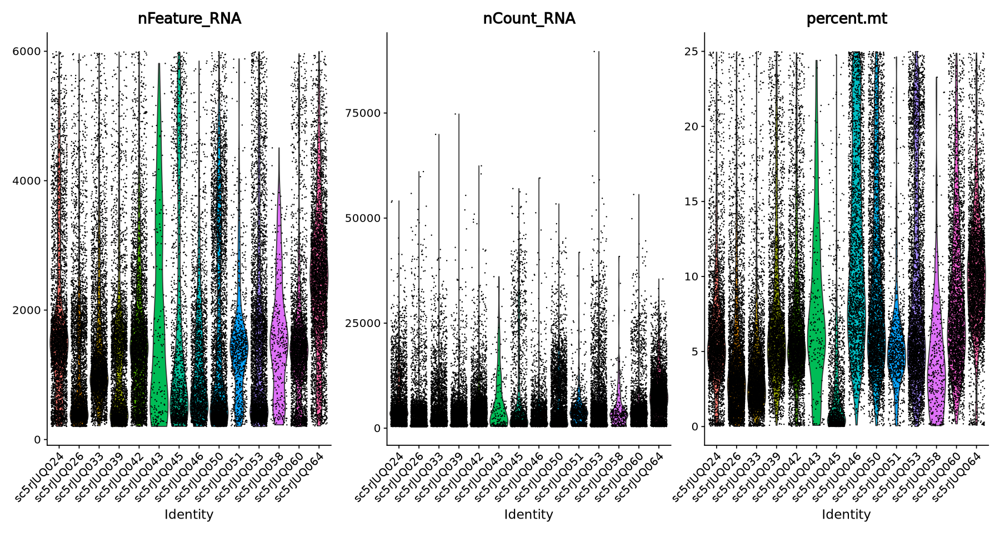

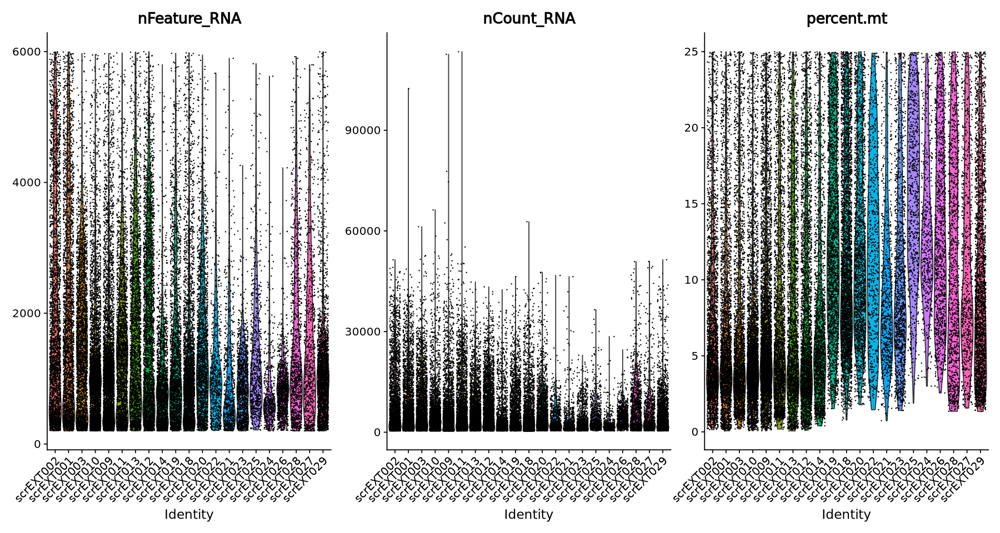

In [40]:
#QC Steps 
BCn[["percent.mt"]] <- PercentageFeatureSet(BCn, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(BCn, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

#QC Steps 
CRCn[["percent.mt"]] <- PercentageFeatureSet(CRCn, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(CRCn, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [41]:
#Normalise the data
BCn <- NormalizeData(BCn)
CRCn <- NormalizeData(CRCn)

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Normalizing layer: counts.7

Normalizing layer: counts.8

Normalizing layer: counts.9

Normalizing layer: counts.10

Normalizing layer: counts.11

Normalizing layer: counts.12

Normalizing layer: counts.13

Normalizing layer: counts.14

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Normalizing layer: counts.7

Normalizing layer: counts.8

Normalizing layer: counts.9

Normalizing layer: counts.10

Normalizing layer: counts.11

Normalizing layer: counts.12

Normalizing layer: counts.13

Normalizing layer: counts.14

Normalizing layer: counts.15

Normalizing layer: counts.16

Normalizing layer: counts.17

Normalizing layer: counts.18

Normalizing layer: counts.19

Normalizing layer: counts.20

In [42]:
#Find variable features
BCn <- FindVariableFeatures(BCn, selection.method = "vst", nfeatures = 2000)
CRCn <- FindVariableFeatures(CRCn, selection.method = "vst", nfeatures = 2000)

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Finding variable features for layer counts.7

Finding variable features for layer counts.8

Finding variable features for layer counts.9

Finding variable features for layer counts.10

Finding variable features for layer counts.11

Finding variable features for layer counts.12

Finding variable features for layer counts.13

Finding variable features for layer counts.14

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Finding variable features for layer counts.7

Finding variable features for

In [43]:
#Scale the data
BCn <- ScaleData(BCn, vars.to.regress = c("percent.mt", "nCount_RNA"))
CRCn <- ScaleData(CRCn, vars.to.regress = c("percent.mt", "nCount_RNA"))

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix



In [45]:
#Run PCA
BCn <- RunPCA(BCn, features = VariableFeatures(object = BCn))
CRCn <- RunPCA(CRCn, features = VariableFeatures(object = CRCn))

PC_ 1 
Positive:  LAPTM5, CD74, BTG2, COTL1, GATA3, LTB, SYNGR2, ITGB2, SPINT2, ALOX5AP 
	   CD7, RGS1, HLA-DPA1, CCL5, NCF1, DUSP4, HLA-DRB1, HLA-DPB1, PKIB, HLA-DRB5 
	   HLA-DQA1, PIM2, SEC11C, CTSW, NKG7, ZG16B, CST7, GZMA, SMIM22, HLA-DQB1 
Negative:  COL6A2, COL6A1, COL1A2, COL1A1, SPARC, COL3A1, AEBP1, COL5A2, MMP2, DCN 
	   FSTL1, COL5A1, SFRP2, LUM, IGFBP7, MXRA8, C1S, CALD1, THBS2, THY1 
	   CTSK, FBN1, MXRA5, TIMP2, IGFBP4, VCAN, COL6A3, CCDC80, TIMP3, RARRES2 
PC_ 2 
Positive:  TYROBP, FCER1G, AIF1, CD68, SPI1, MS4A6A, FCGR3A, CSF1R, CD14, FCGR2A 
	   CYBB, MS4A7, C1QC, HLA-DRA, HLA-DRB1, FPR3, LILRB4, C1QA, C1QB, LST1 
	   HLA-DPA1, PILRA, LILRB2, MSR1, CD163, FGL2, LYZ, FCGR1A, HLA-DPB1, ADAP2 
Negative:  GATA3, SMIM22, KRT18, ELF3, SPDEF, ZG16B, KRT19, ESR1, AZGP1, TFF3 
	   ANKRD30A, MUC1, AR, ERBB3, MLPH, FOXA1, SLC39A6, CPB1, KRT8, TFAP2A 
	   RAB25, FAM3B, FXYD3, XBP1, LRP2, TACSTD2, PRLR, KIAA1324, PHGR1, FASN 
PC_ 3 
Positive:  VWF, PLVAP, ADGRL4, CLEC14A, RAMP2, E

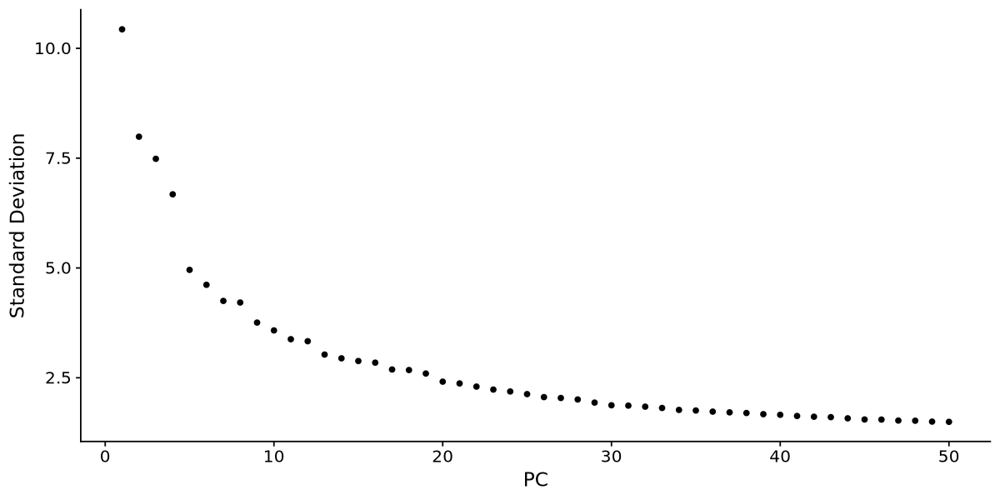

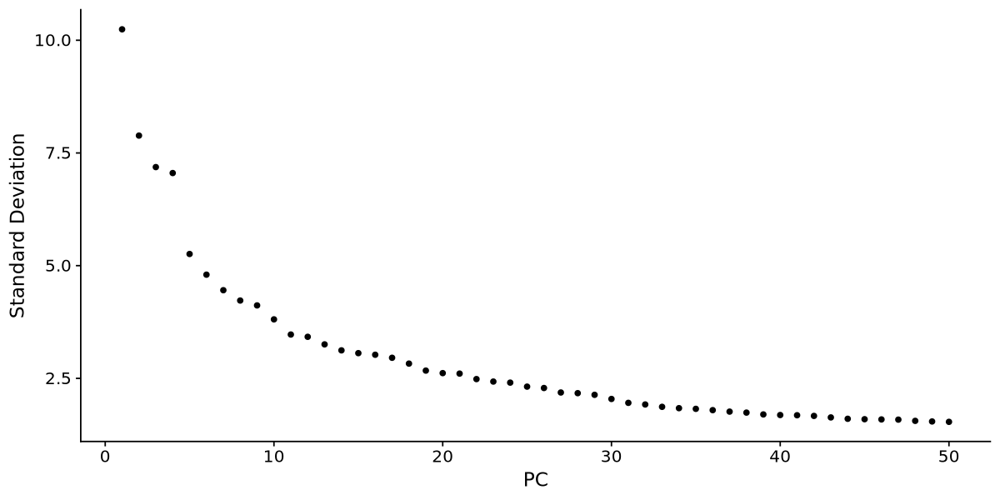

In [46]:
#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(BCn, ndims=50)
ElbowPlot(CRCn, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

In [47]:
#Find neighbours (make sure number matches no. features chosen above)
BCn <- FindNeighbors(BCn, dims = 1:40)
CRCn <- FindNeighbors(CRCn, dims = 1:40)

Computing nearest neighbor graph



Computing SNN

Computing nearest neighbor graph

Computing SNN



In [48]:
#Run UMAP
BCn <- RunUMAP(BCn, dims = 1:40)
CRCn <- RunUMAP(CRCn, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


13:44:04 UMAP embedding parameters a = 0.9922 b = 1.112

13:44:04 Read 44024 rows and found 40 numeric columns

13:44:04 Using Annoy for neighbor search, n_neighbors = 30

13:44:04 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:44:07 Writing NN index file to temp file /scratch/temp/9833857/RtmpfrMnnk/file2ea5d73b0f164b

13:44:07 Searching Annoy index using 1 thread, search_k = 3000

13:44:18 Annoy recall = 100%

13:44:19 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

13:44:20 Initializing from normalized Laplacian + noise (using RSpectra)

13:44:22 Commencing optimization for 200 epochs, with 1988884 positive edges

13:44:37 Optimization finished

13:44:37 UMAP embedding parameters a = 0.9922 b = 1.112

13:44:37 Read 44684 

In [49]:
#Cluster, resolution here set to 0.2
BCn <- FindClusters(BCn, resolution = 0.2)
CRCn <- FindClusters(CRCn, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44024
Number of edges: 1687390

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9658
Number of communities: 18
Elapsed time: 8 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44684
Number of edges: 1705803

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9734
Number of communities: 18
Elapsed time: 6 seconds


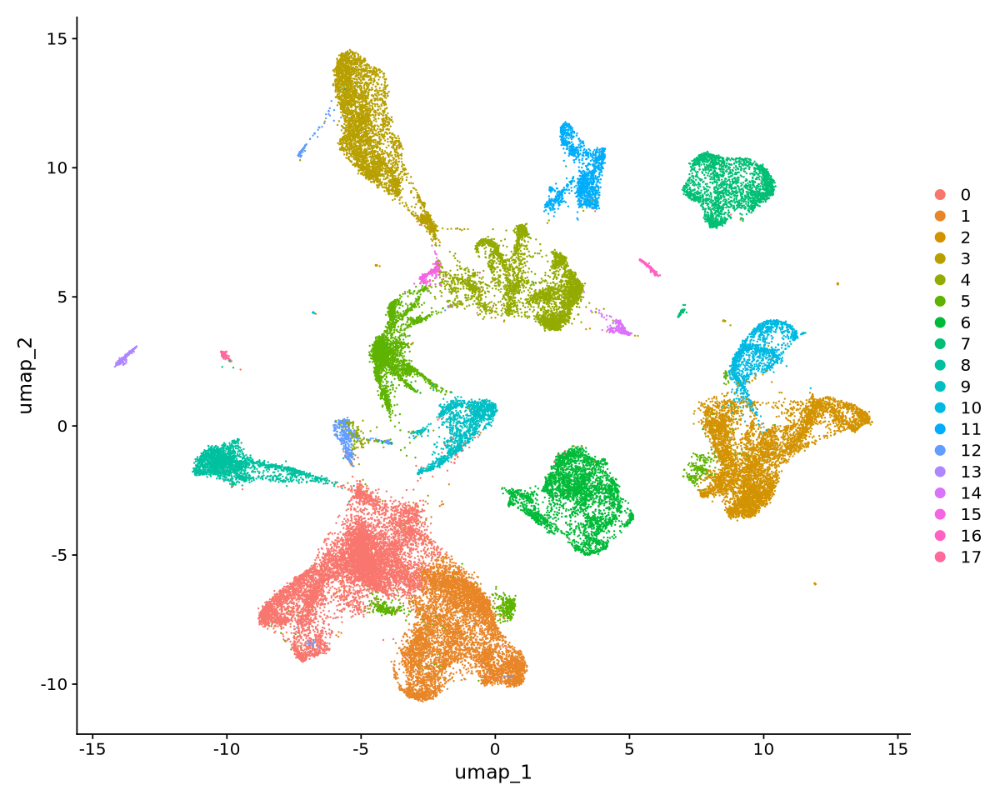

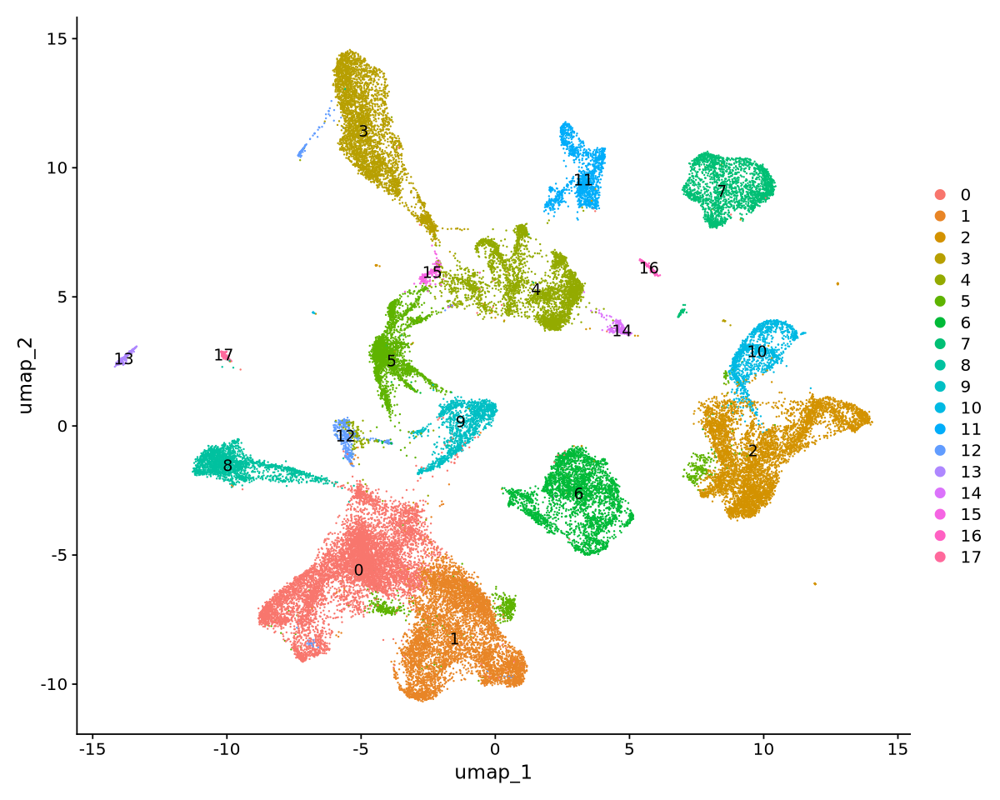

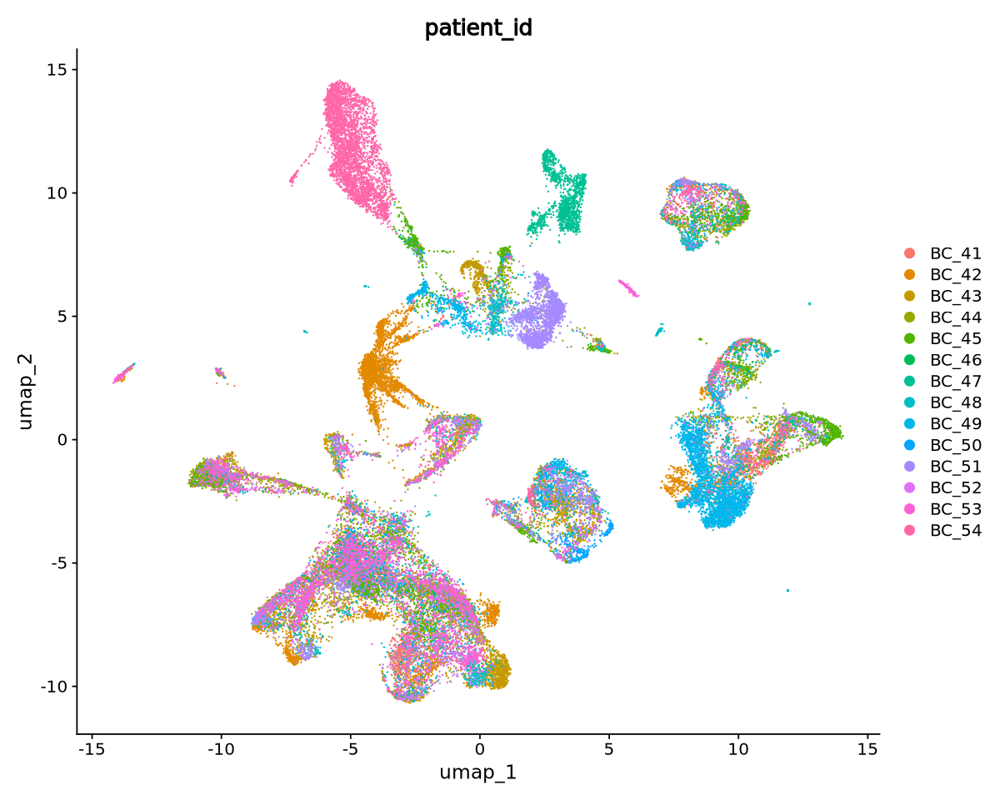

In [50]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(BCn, reduction = "umap")
DimPlot(BCn, reduction = "umap", label=TRUE)
DimPlot(BCn, reduction = "umap", group = "patient_id")

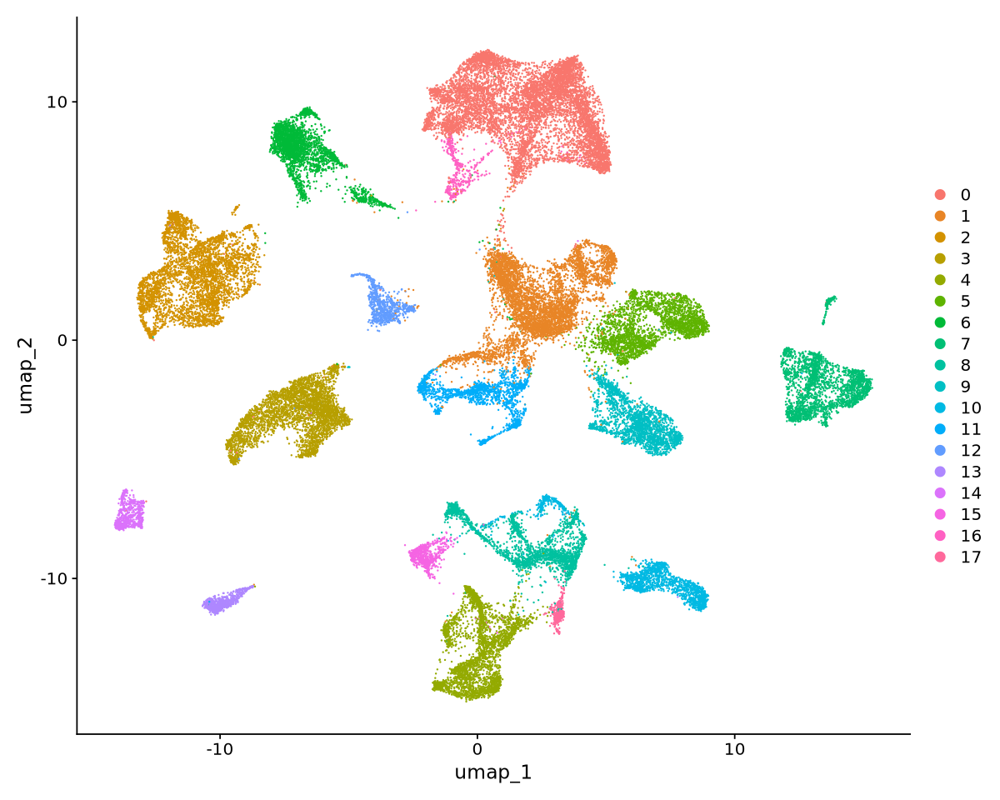

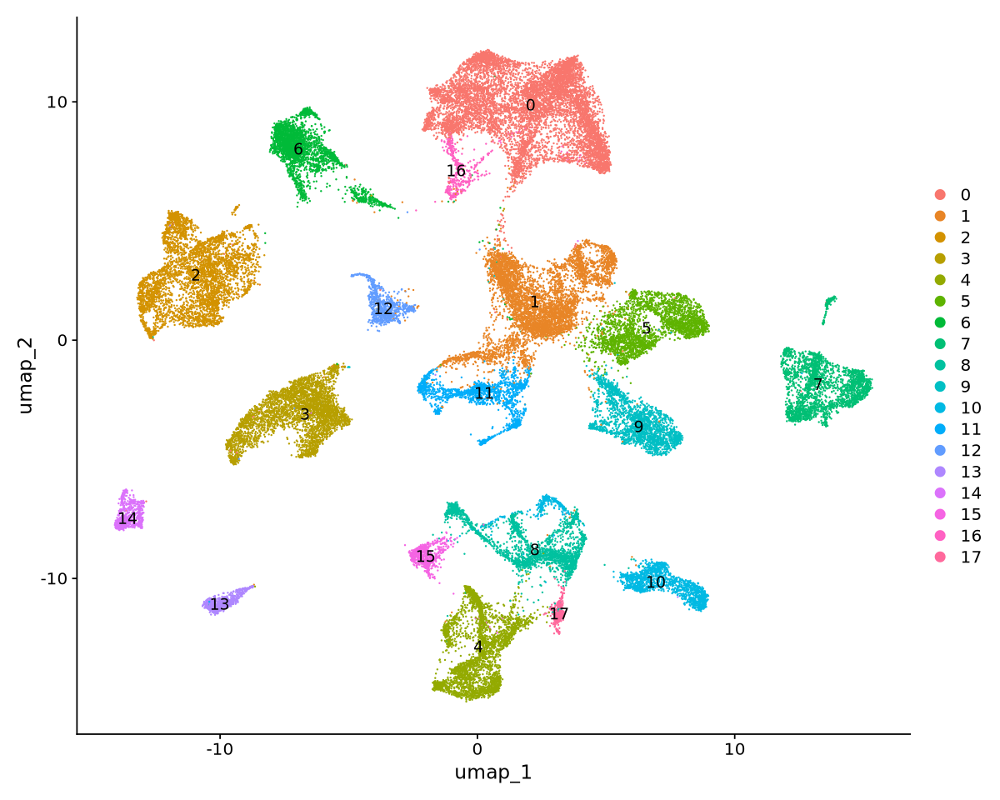

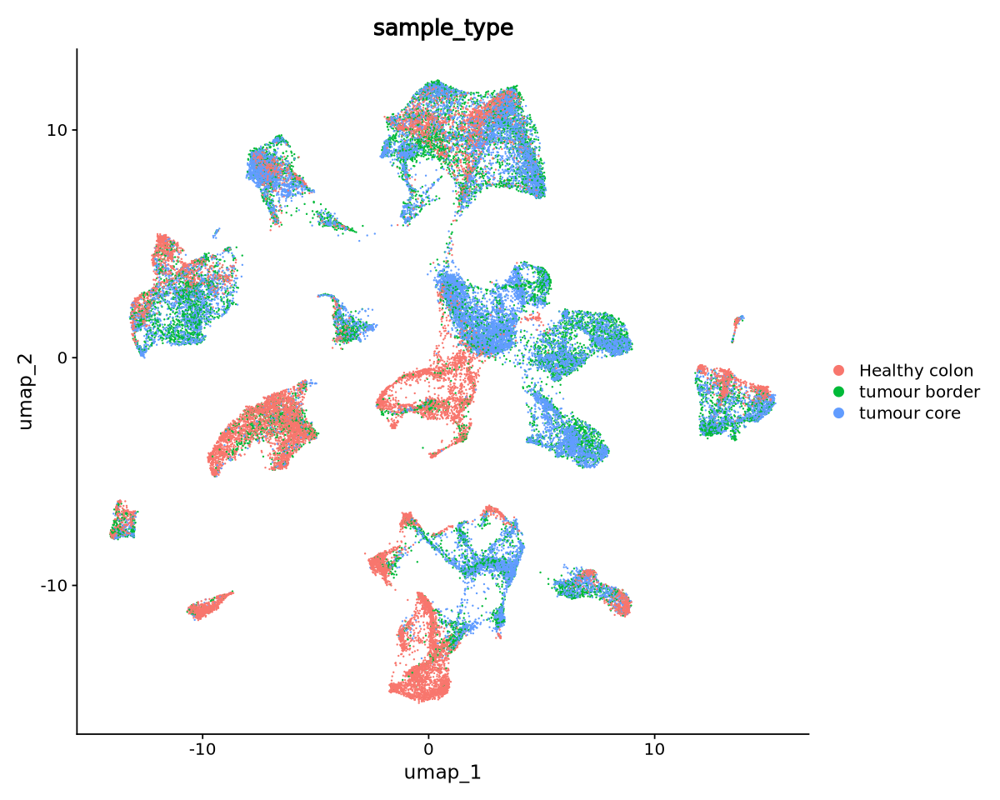

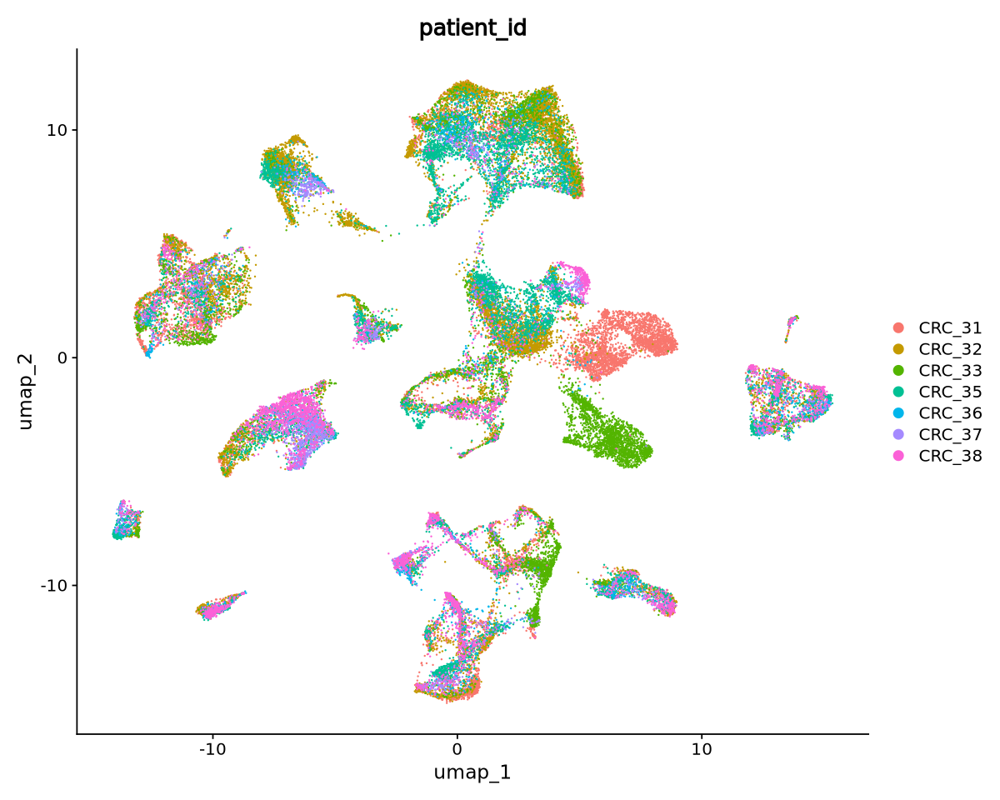

In [51]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(CRCn, reduction = "umap")
DimPlot(CRCn, reduction = "umap", label=TRUE)
DimPlot(CRCn, reduction = "umap", group = "sample_type")
DimPlot(CRCn, reduction = "umap", group = "patient_id")

In [52]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(BCn, file = "/scratch/user/s4436039/scdata/PMID32561858/PMID32561858_BC.RDS")
saveRDS(CRCn, file = "/scratch/user/s4436039/scdata/PMID32561858/PMID32561858_CRC.RDS")

#### Next part of code is about determining which cluster is the myeloid cells

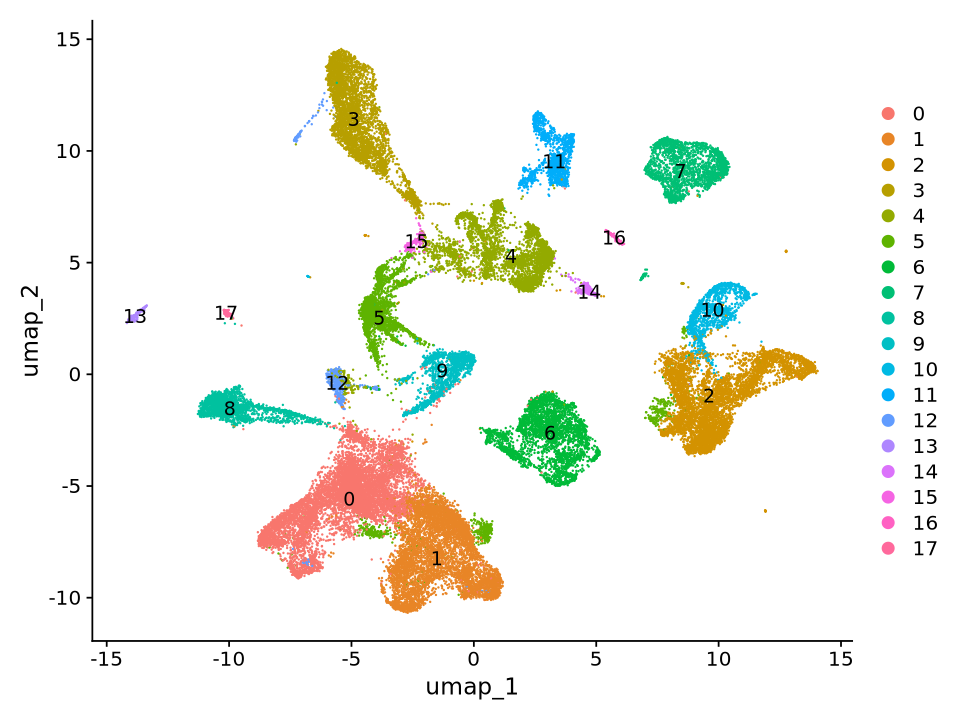

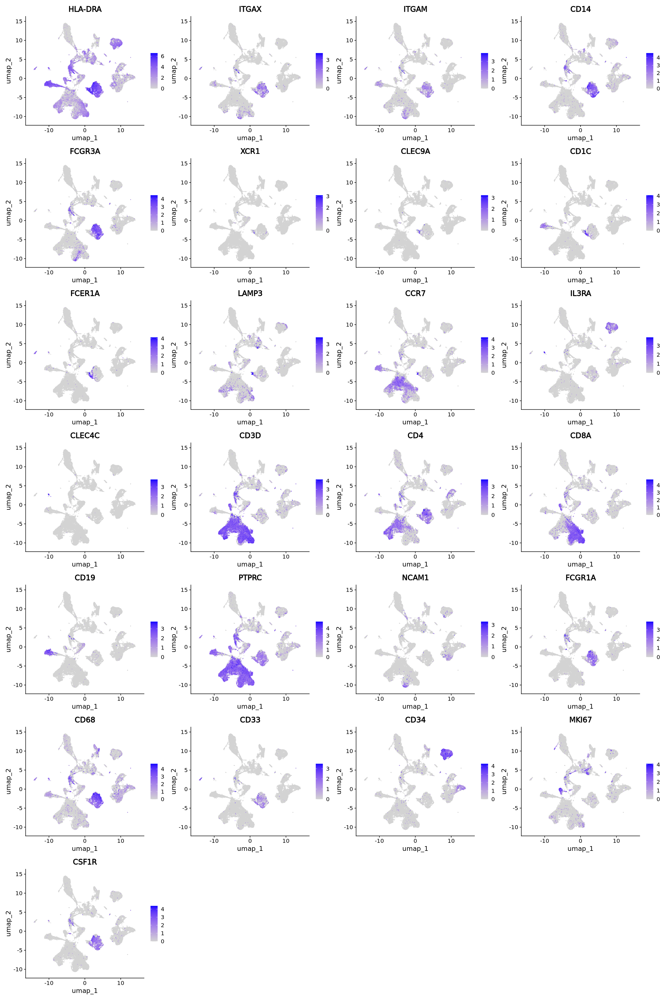

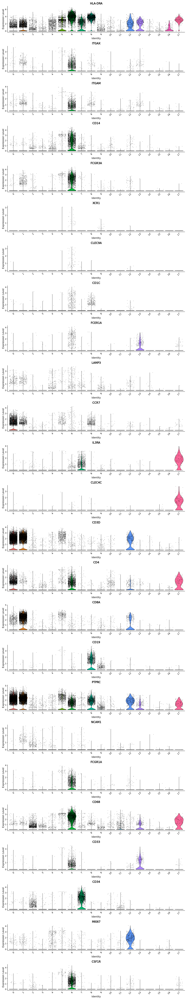

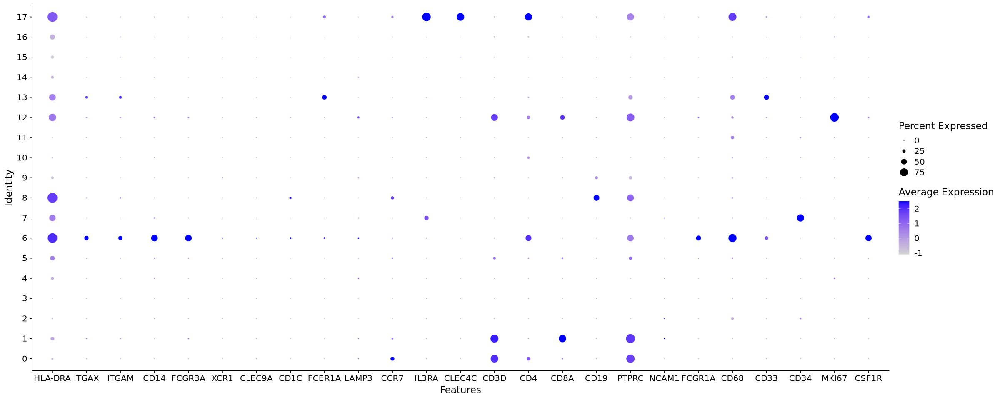

In [53]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(BCn, reduction = "umap", label=TRUE)

options(repr.plot.height=30, repr.plot.width=20)
FeaturePlot(BCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(BCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(BCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))

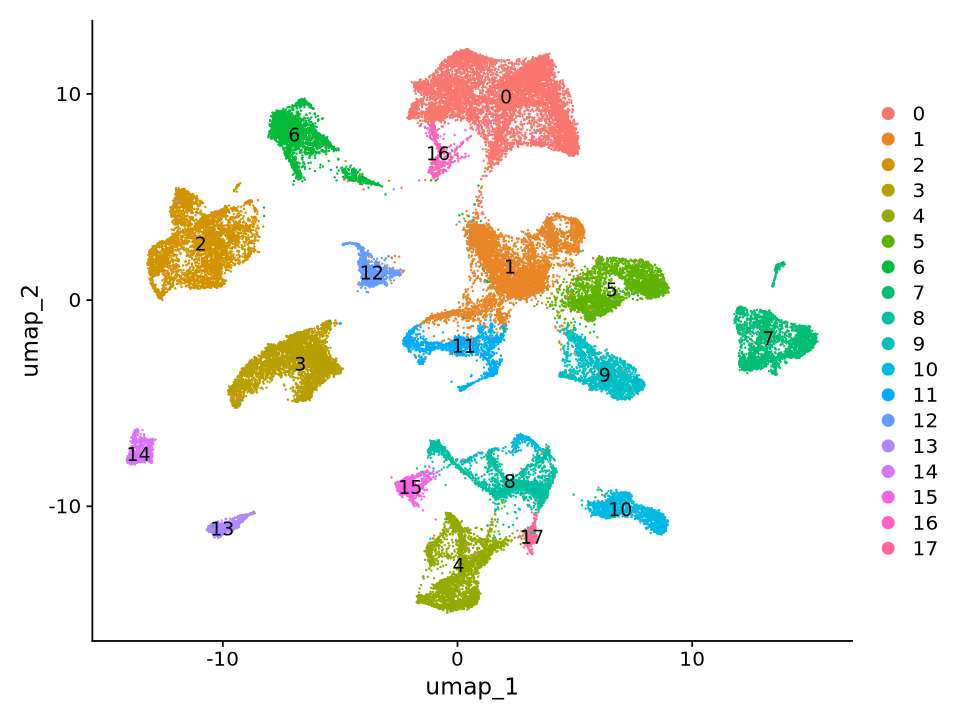

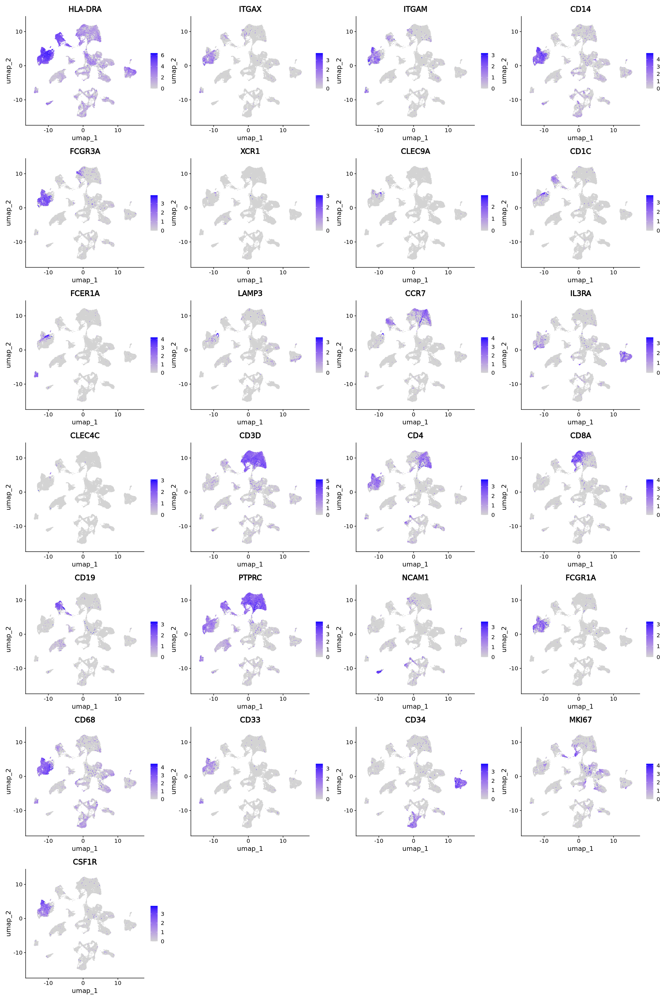

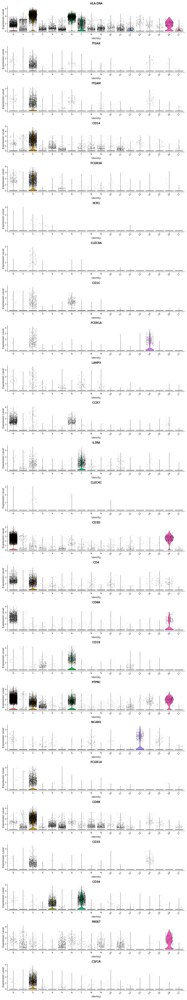

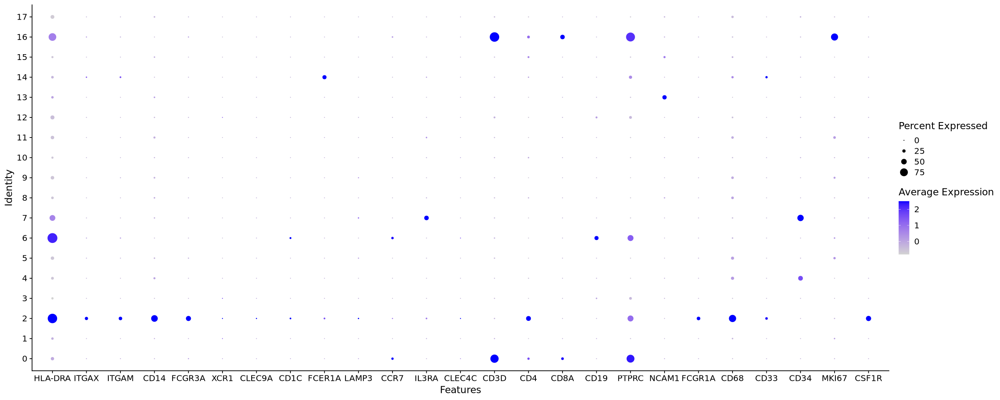

In [54]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(CRCn, reduction = "umap", label=TRUE)

options(repr.plot.height=30, repr.plot.width=20)
FeaturePlot(CRCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(CRCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(CRCn, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))

#### BC: From above it looks like cluster 6 is the myeloid cells, now subsetting out this cluster
#### CRC: From above it looks like cluster 2 is the myeloid cells, now subsetting out this cluster

In [55]:
head(BCn@meta.data)
head(CRCn@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAACAACCT,sc5rJUQ024,1624,894,sc5rJUQ024_AAACCTGCAACAACCT,894,1624,TRUE,41,BC,Biopsy,DC,tumour,breast cancer,BC_41,PMID32561858_breast_41,2.216749,6,6
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGCAAGAAGAG,sc5rJUQ024,2983,1401,sc5rJUQ024_AAACCTGCAAGAAGAG,1401,2983,TRUE,41,BC,Biopsy,T_cell,tumour,breast cancer,BC_41,PMID32561858_breast_41,3.419376,1,1
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGGTCTCCACT,sc5rJUQ024,1141,585,sc5rJUQ024_AAACCTGGTCTCCACT,585,1141,TRUE,41,BC,Biopsy,Cancer,tumour,breast cancer,BC_41,PMID32561858_breast_41,1.051709,17,17
PMID32561858_BC_Pt41_sc5rJUQ024_AAACCTGTCAACGAAA,sc5rJUQ024,18953,4233,sc5rJUQ024_AAACCTGTCAACGAAA,4233,18953,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41,4.505883,6,6
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGAGAGTAAGG,sc5rJUQ024,3794,1669,sc5rJUQ024_AAACGGGAGAGTAAGG,1669,3794,TRUE,41,BC,Biopsy,Fibroblast,tumour,breast cancer,BC_41,PMID32561858_breast_41,10.253031,10,10
PMID32561858_BC_Pt41_sc5rJUQ024_AAACGGGCACAGAGGT,sc5rJUQ024,4891,1818,sc5rJUQ024_AAACGGGCACAGAGGT,1818,4891,TRUE,41,BC,Biopsy,Myeloid,tumour,breast cancer,BC_41,PMID32561858_breast_41,5.050092,6,6


,orig.ident,nCount_RNA,nFeature_RNA,Cell,nGene,nUMI,CellFromTumor,PatientNumber,TumorType,TumorSite,CellType,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGGGCTCTC,scrEXT002,21591,4884,scrEXT002_AAACCTGAGGGCTCTC,4884,21591,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,20.726229,5,5
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGAGTTACCCA,scrEXT002,8795,2432,scrEXT002_AAACCTGAGTTACCCA,2432,8795,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,22.001137,5,5
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGCATCTGGTA,scrEXT002,3645,1186,scrEXT002_AAACCTGCATCTGGTA,1186,3645,TRUE,31,CRC,B,Mast_cell,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,2.331962,14,14
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACCTGTCTGAGGGA,scrEXT002,652,378,scrEXT002_AAACCTGTCTGAGGGA,378,652,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,21.319018,5,5
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGATAGGAG,scrEXT002,1397,545,scrEXT002_AAACGGGAGATAGGAG,545,1397,TRUE,31,CRC,B,Cancer,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,5.654975,10,10
PMID32561858_CRC_Pt31_Btumour_scrEXT002_AAACGGGAGTACATGA,scrEXT002,22434,4492,scrEXT002_AAACGGGAGTACATGA,4492,22434,TRUE,31,CRC,B,Fibroblast,tumour border,CRC,CRC_31,PMID32561858_CRC_31_BTu,3.820094,8,8


In [56]:
myeloid_BC <- subset(BCn, subset = RNA_snn_res.0.2 %in% c("6"))
myeloid_CRC <- subset(CRCn, subset = RNA_snn_res.0.2 %in% c("2"))

In [57]:
BCn
myeloid_BC
CRCn
myeloid_CRC

An object of class Seurat 
33694 features across 44024 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 29 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
33694 features across 3171 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 29 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
33694 features across 44684 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 43 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18, counts.19, counts.20, counts.21, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, data.15, data.16, data.17, data.18, data.19, data.20, data.21, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
33694 features across 4219 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 43 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18, counts.19, counts.20, counts.21, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, data.15, data.16, data.17, data.18, data.19, data.20, data.21, scale.data
 2 dimensional reductions calculated: pca, umap

In [58]:
saveRDS(myeloid_BC, "/scratch/user/s4436039/scdata/PMID32561858/PMID32561858_BC_myeloid.RDS")
saveRDS(myeloid_CRC, "/scratch/user/s4436039/scdata/PMID32561858/PMID32561858_CRC_myeloid.RDS")

#### Following the above then need to move entire PMID32561858 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/PMID32561858/ /QRISdata/Q5935/nikita/scdata/PMID32561858
```